# DLDC Project Dataviewer
## Load the Data

In [12]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="whitegrid")

unit = ['unit_number','time']
settings = ['operational_setting 1','operational_setting 2','operational_setting 3']
sensors = [f"sensor_{i}" for i in range(1, 22)]

columns = unit+settings+sensors
pwd = './data/'

# Load data for FD001
train_FD001 = pd.read_csv(pwd+'train_FD001.txt', delimiter=' ', header=None, index_col=False, names=columns)
test_FD001 = pd.read_csv(pwd+'test_FD001.txt', delimiter=' ', header=None, index_col=False, names=columns)
RUL_FD001 = pd.read_csv(pwd+'RUL_FD001.txt', header=None)


# Load data for FD002
train_FD002 = pd.read_csv(pwd+'train_FD002.txt', delimiter=' ', header=None, index_col=False, names=columns)
test_FD002 = pd.read_csv(pwd+'test_FD002.txt', delimiter=' ', header=None, index_col=False, names=columns)
RUL_FD002 = pd.read_csv(pwd+'RUL_FD002.txt', header=None)

# Load data for FD003
train_FD003 = pd.read_csv(pwd+'train_FD003.txt', delimiter=' ', header=None, index_col=False, names=columns)
test_FD003 = pd.read_csv(pwd+'test_FD003.txt', delimiter=' ', header=None, index_col=False, names=columns)
RUL_FD003 = pd.read_csv(pwd+'RUL_FD003.txt', header=None)

# Load data for FD004
train_FD004 = pd.read_csv(pwd+'train_FD004.txt', delimiter=' ', header=None, index_col=False, names=columns)
test_FD004 = pd.read_csv(pwd+'test_FD004.txt', delimiter=' ', header=None, index_col=False, names=columns)
RUL_FD004 = pd.read_csv(pwd+'RUL_FD004.txt', header=None)

# Add unit names to RUL
for RUL in [RUL_FD001, RUL_FD002, RUL_FD003, RUL_FD004]:
    RUL.insert(0, '-', [unit_name for unit_name in range(1,RUL.shape[0]+1)], True)
    RUL.columns = [unit[0],'RUL']

C:\Users\kleme\AppData\Local\Temp\ipykernel_32832\2662633332.py:16: ParserWarning: Length of header or names does not match length of data. This leads to a loss of data with index_col=False.
  train_FD001 = pd.read_csv(pwd+'train_FD001.txt', delimiter=' ', header=None, index_col=False, names=columns)
C:\Users\kleme\AppData\Local\Temp\ipykernel_32832\2662633332.py:17: ParserWarning: Length of header or names does not match length of data. This leads to a loss of data with index_col=False.
  test_FD001 = pd.read_csv(pwd+'test_FD001.txt', delimiter=' ', header=None, index_col=False, names=columns)
C:\Users\kleme\AppData\Local\Temp\ipykernel_32832\2662633332.py:22: ParserWarning: Length of header or names does not match length of data. This leads to a loss of data with index_col=False.
  train_FD002 = pd.read_csv(pwd+'train_FD002.txt', delimiter=' ', header=None, index_col=False, names=columns)
C:\Users\kleme\AppData\Local\Temp\ipykernel_32832\2662633332.py:23: ParserWarning: Length of hea

## Visualize Correlation between Measurements

In [13]:
def add_RUL_column(df):
    train_grouped_by_unit = df.groupby(by=unit[0]) 
    max_time_cycles = train_grouped_by_unit['time'].max() 
    merged = df.merge(max_time_cycles.to_frame(name='max_time_cycle'), left_on=unit[0],right_index=True)
    merged["RUL"] = merged["max_time_cycle"] - merged['time']
    merged = merged.drop("max_time_cycle", axis=1) 
    return merged

train_FD001 = add_RUL_column(train_FD001)

train_FD001

,unit_number,time,operational_setting 1,operational_setting 2,operational_setting 3,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,...,sensor_13,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21,RUL
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,191
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,190
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,189
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735,4
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594,3
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333,2
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640,1


<AxesSubplot: >

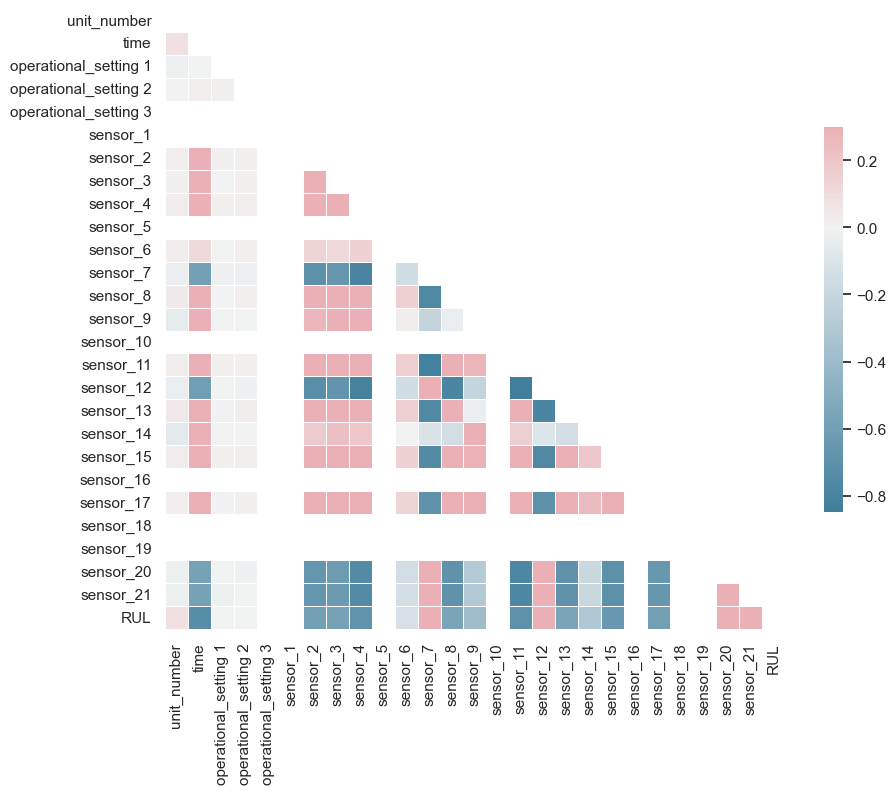

In [14]:
# Compute the correlation matrix
corr = train_FD001.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(10, 10))
cmap = sns.diverging_palette(230, 10, as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [15]:
# Correlation of Measurements to RUL
corr.tail(1).transpose()

,RUL
unit_number,0.078753
time,-0.736241
operational_setting 1,-0.003198
operational_setting 2,-0.001948
operational_setting 3,NaN
sensor_1,NaN
sensor_2,-0.606484
sensor_3,-0.584520
sensor_4,-0.678948
sensor_5,NaN


## Drop Labels that have no correlation to RUL

- Drop Sensors that have no corr with RUL at all (NaN)
- Drop Sensors with low correlation (<0.5)
- IDEA: Bin sensors which bifurcate? (https://developers.google.com/machine-learning/data-prep/transform/normalization)

In [16]:
corr = train_FD001.corr()

for sensor in settings:
    # corr.tail(1)[sensor]
    # print(sensor+f": {corr.tail(1)[sensor].isna().all()}")
    if corr.tail(1)[sensor].isna().any():
        corr = corr.drop(columns=sensor)

for sensor in sensors:
    # corr.tail(1)[sensor]
    # print(sensor+f": {corr.tail(1)[sensor].isna().all()}")
    if corr.tail(1)[sensor].isna().any():
        corr = corr.drop(columns=sensor)

low_correlation = ['sensor_6']
bifurcate = ['sensor_9', 'sensor_14']

for sensor in low_correlation+bifurcate:
    # corr.tail(1)[sensor]
    # print(sensor+f": {corr.tail(1)[sensor].isna().all()}")
    corr = corr.drop(columns=sensor)

features = corr.columns
corr.tail(1).transpose()

print(features)

Index(['unit_number', 'time', 'operational_setting 1', 'operational_setting 2',
       'sensor_2', 'sensor_3', 'sensor_4', 'sensor_7', 'sensor_8', 'sensor_11',
       'sensor_12', 'sensor_13', 'sensor_15', 'sensor_17', 'sensor_20',
       'sensor_21', 'RUL'],
      dtype='object')


In [32]:
sensor_dictionary = {'sensor_1': '(Fan inlet temperature) ($^◦$R)',
 'sensor_2': '(LPC outlet temperature) ($^◦$R)',
 'sensor_3': '(HPC outlet temperature) ($^◦$R)',
 'sensor_4': '(LPT outlet temperature) ($^◦$R)',
 'sensor_5': '(Fan inlet Pressure) (psia)',
 'sensor_6': '(bypass-duct pressure) (psia)',
 'sensor_7': '(HPC outlet pressure) (psia)',
 'sensor_8': '(Physical fan speed) (rpm)',
 'sensor_9': '(Physical core speed) (rpm)',
 'sensor_10': '(Engine pressure ratio(P50/P2)',
 'sensor_11': '(HPC outlet Static pressure) (psia)',
 'sensor_12': '(Ratio of fuel flow to Ps30) (pps/psia)',
 'sensor_13': '(Corrected fan speed) (rpm)',
 'sensor_14': '(Corrected core speed) (rpm)',
 'sensor_15': '(Bypass Ratio) ',
 'sensor_16': '(Burner fuel-air ratio)',
 'sensor_17': '(Bleed Enthalpy)',
 'sensor_18': '(Required fan speed)',
 'sensor_19': '(Required fan conversion speed)',
 'sensor_20': '(High-pressure turbines Cool air flow)',
 'sensor_21': '(Low-pressure turbines Cool air flow)'}

def plot_signal(df, sensor_dictionary, signal):
    plt.figure(figsize=(13,5))
    for i in df[unit[0]].unique():
        if True or (i % 13 == 0):   #For a better visualisation, we plot the sensors signals of 20 units only
            plt.plot('RUL', (signal), data=df[df[unit[0]]==i].rolling(10).mean())

    plt.xlim(250, 0)  # reverse the x-axis so RUL counts down to zero
    plt.xticks(np.arange(0, 300, 25))
    try:
        plt.ylabel(signal+': '+sensor_dictionary[signal])
    except:
        plt.ylabel(signal)
    plt.xlabel('Remaining Useful Life')
    plt.show()

operational_setting 1


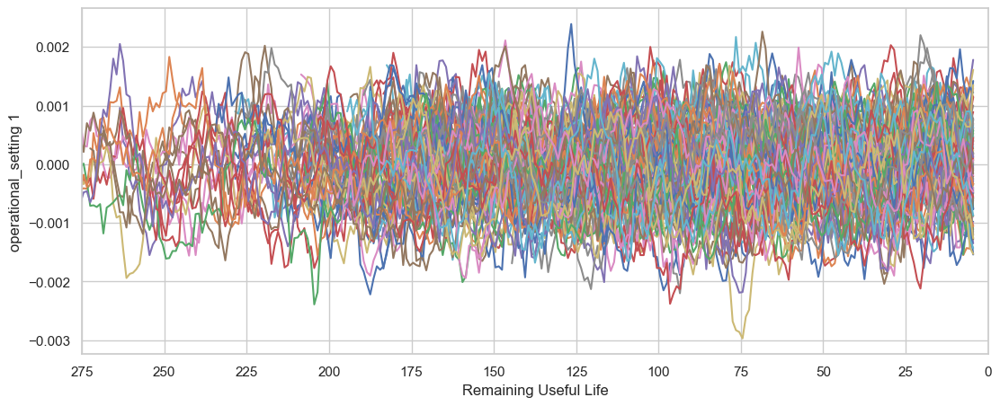

operational_setting 2


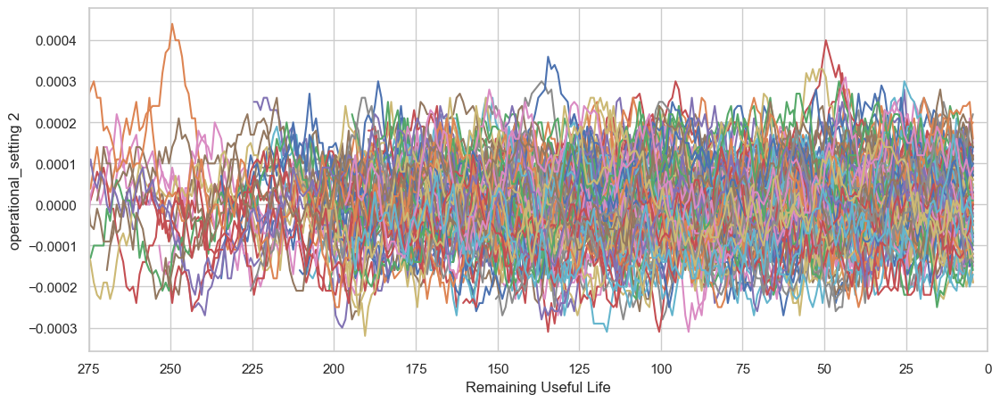

sensor_2


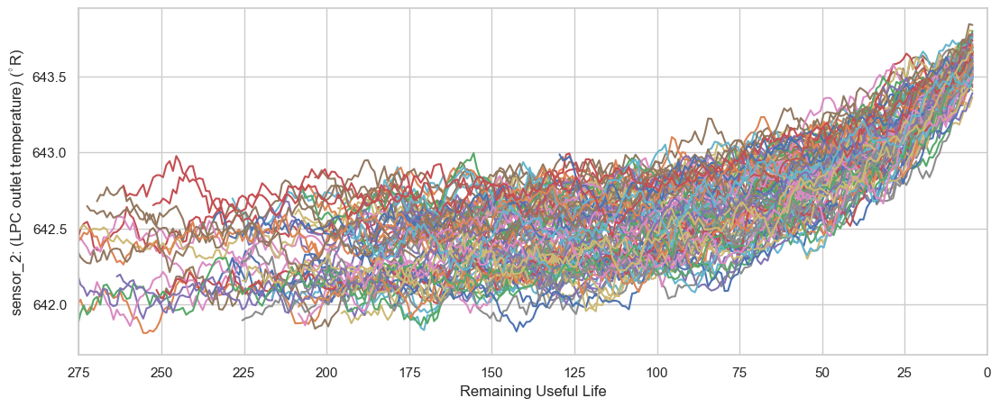

sensor_3


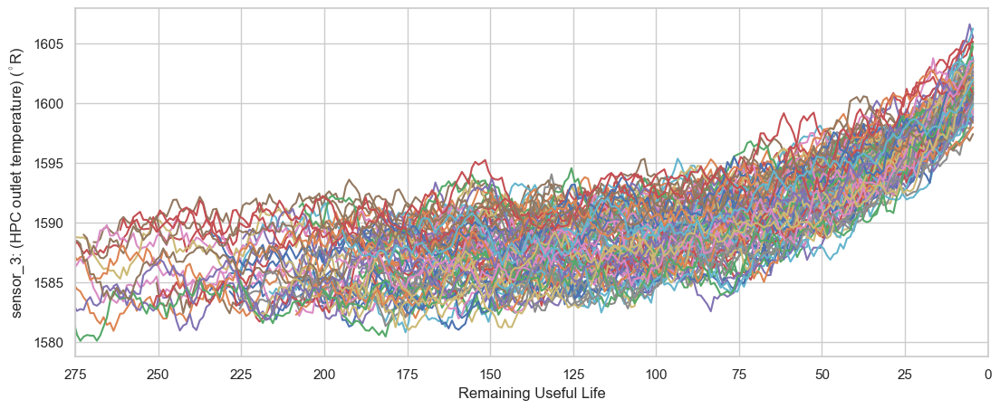

sensor_4


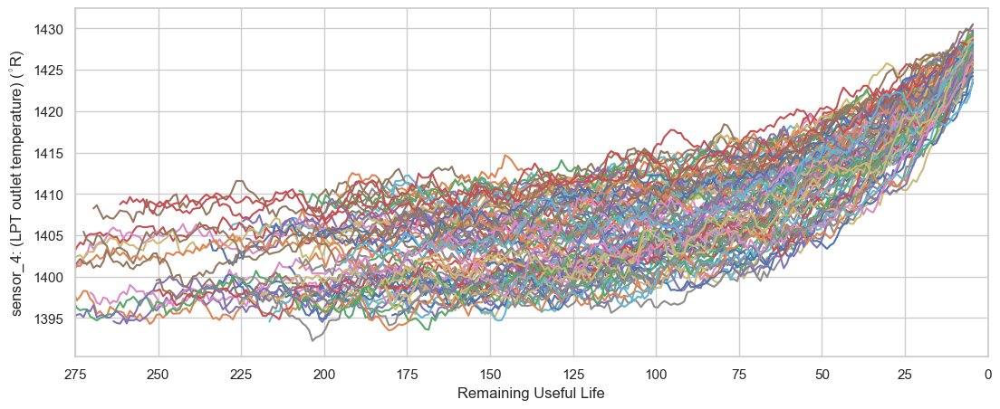

sensor_7


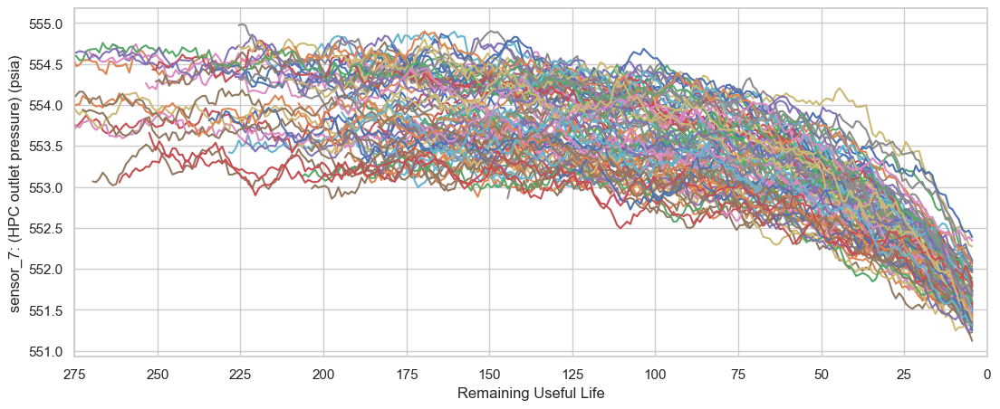

sensor_8


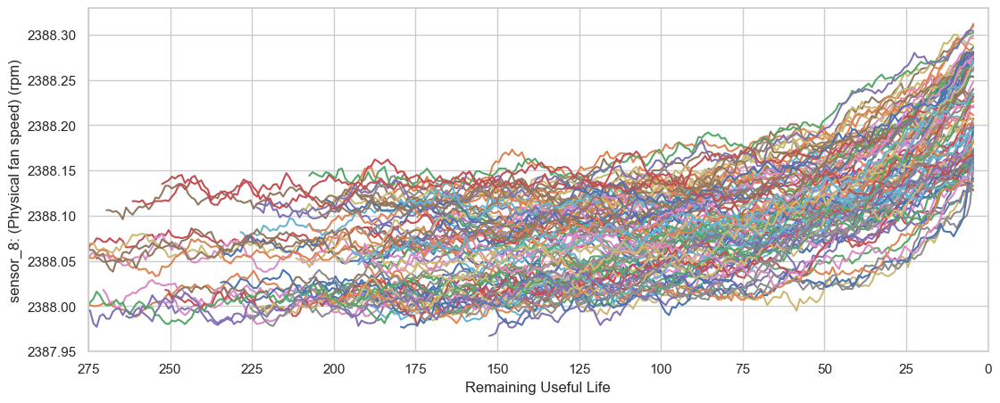

sensor_11


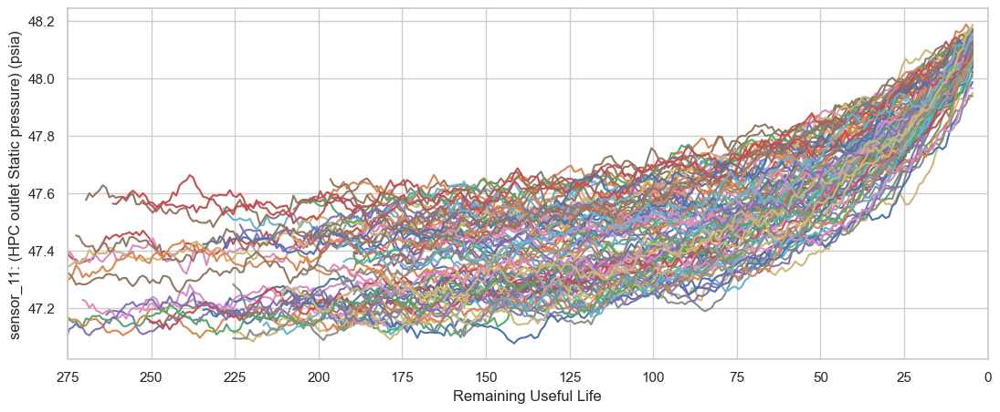

sensor_12


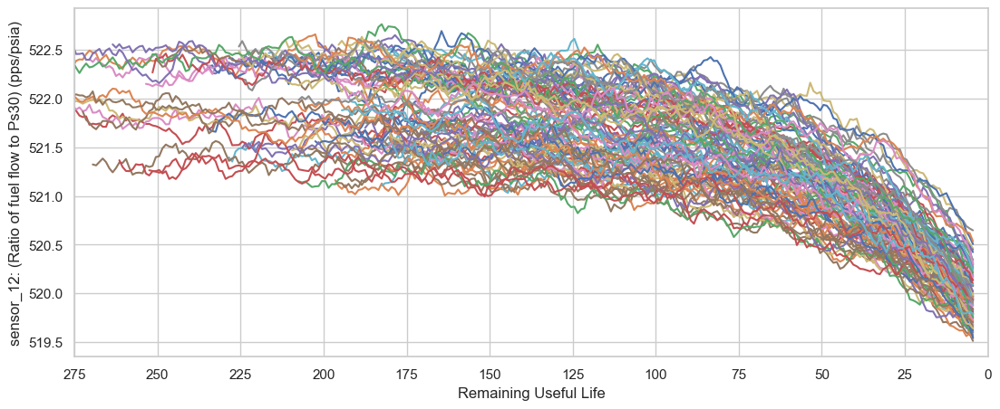

sensor_13


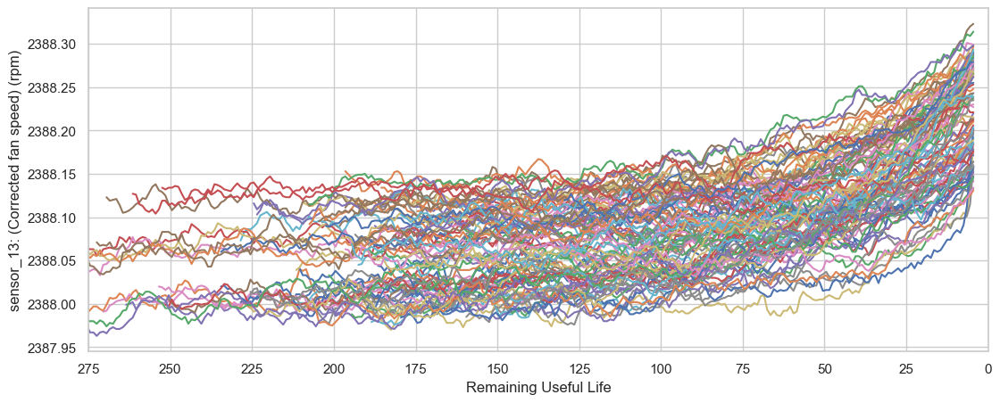

sensor_15


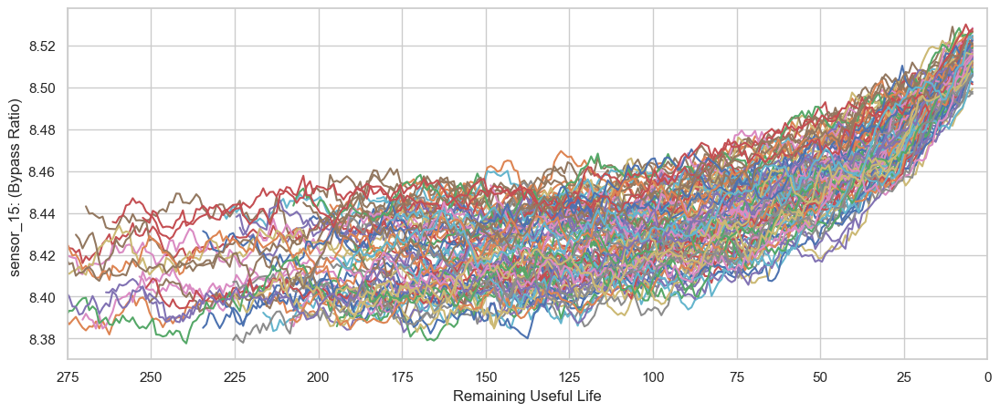

sensor_17


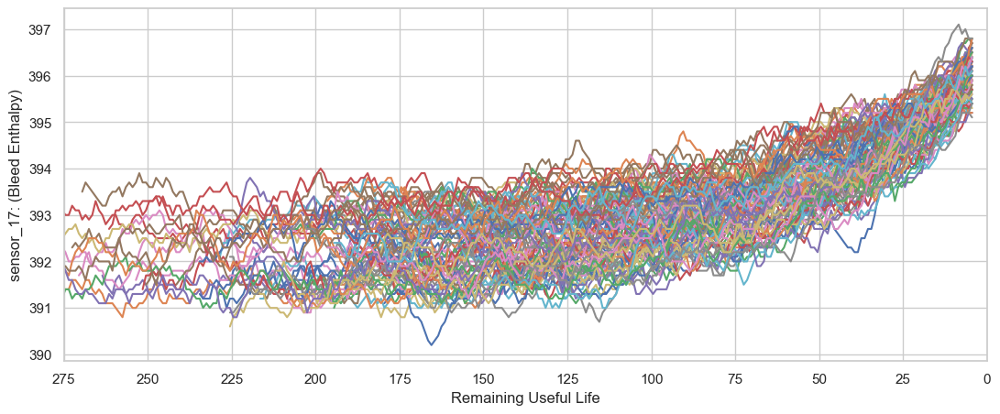

sensor_20


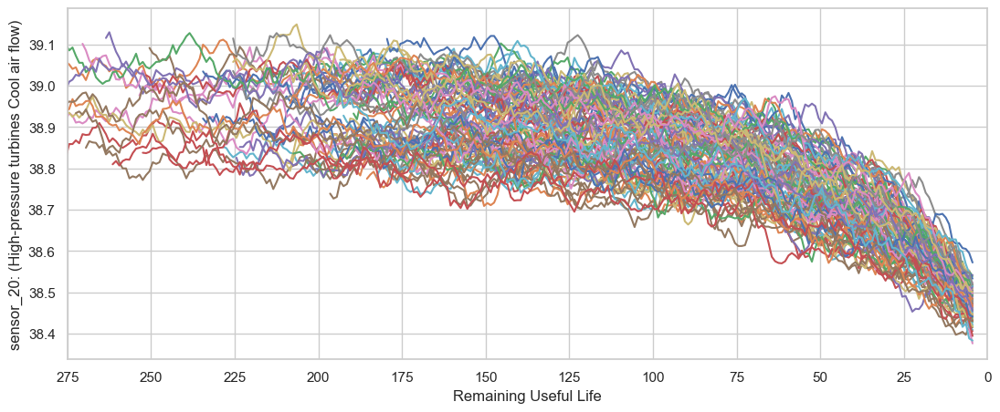

sensor_21


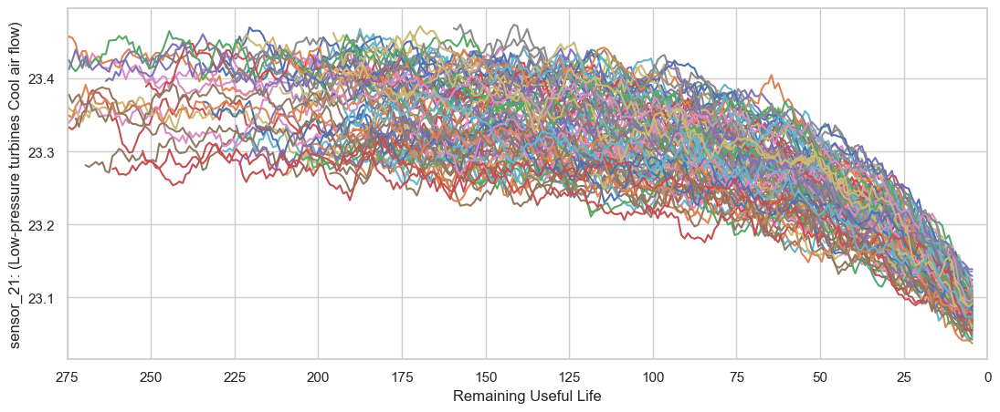

In [33]:
for sensor in features[2:-1]:
    try:
        print(sensor)
        plot_signal(train_FD001, sensor_dictionary,sensor)
    except:
        pass

In [30]:
def plot_signal_test(df, sensor_dictionary, signal):
    plt.figure(figsize=(13,5))
    for i in df[unit[0]].unique():
        if True or (i % 13 == 0):   #For a better visualisation, we plot the sensors signals of 20 units only
            plt.plot('time', (signal), data=df[df[unit[0]]==i].rolling(10).mean())

    plt.xlim(0, 250)  # reverse the x-axis so RUL counts down to zero
    plt.xticks(np.arange(0, 300, 25))
    try:
        plt.ylabel(signal+': '+sensor_dictionary[signal])
    except:
        plt.ylabel(signal)
    plt.xlabel('Time in Flight Cycles')
    plt.show()

sensor_4


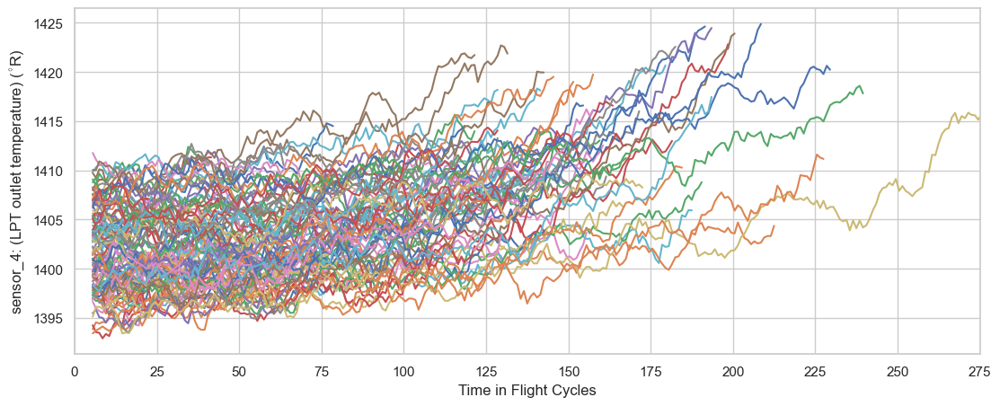

In [31]:
for sensor in ['sensor_4']:
    try:
        print(sensor)
        plot_signal_test(test_FD001, sensor_dictionary,sensor)
    except:
        pass

In [21]:
def plot_histogram(df, sensor_dictionary, signal):
    f, ax = plt.subplots(figsize=(6.5, 6.5))
    sns.despine(f, left=True, bottom=True)
    sns.histplot(x=df['RUL'], y=df[signal],
                    linewidth=0,
                    ax=ax)
    try:
        plt.ylabel(signal+': '+sensor_dictionary[signal])
    except:
        plt.ylabel(signal)
    plt.xlabel('Remaining Useful Life')
    ax.invert_xaxis()

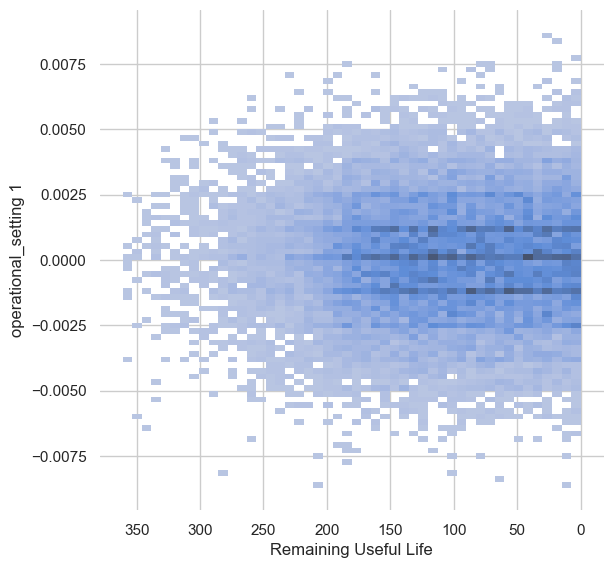

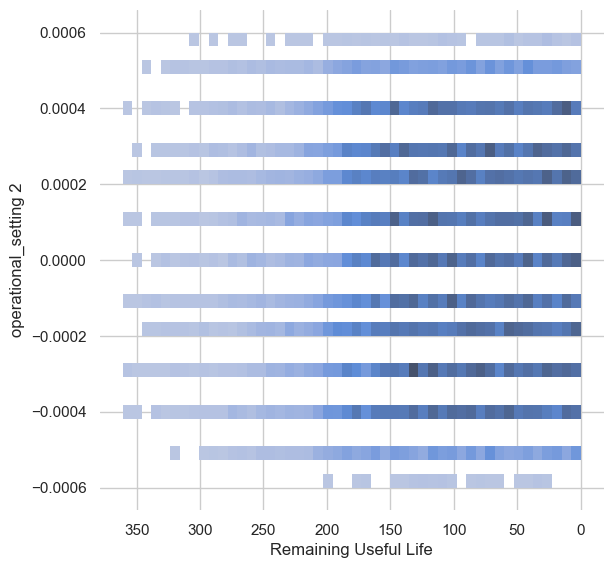

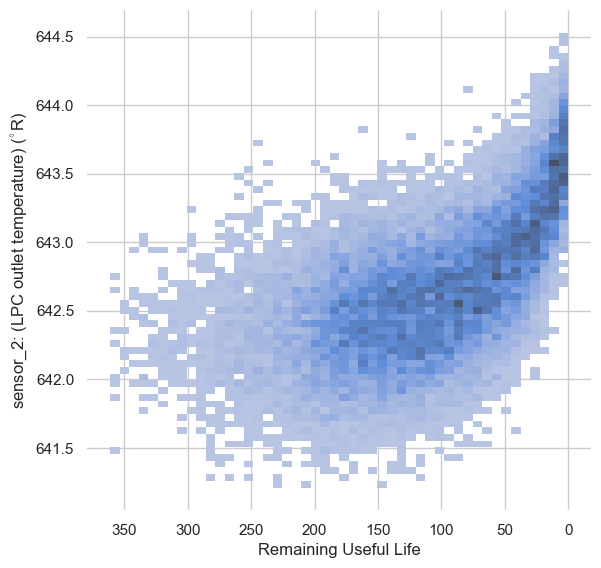

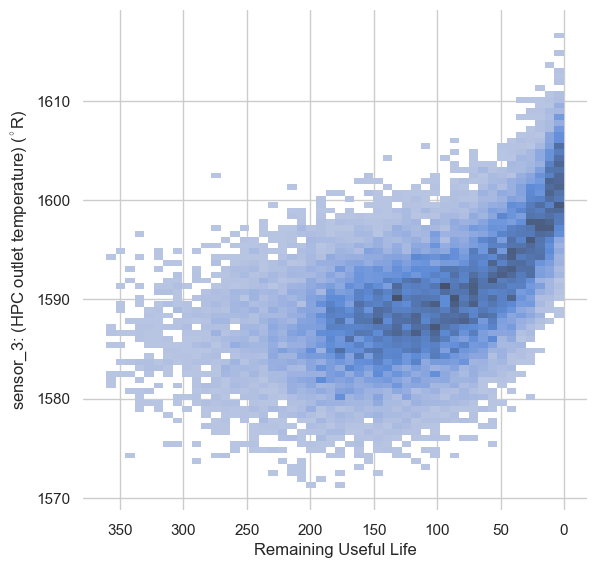

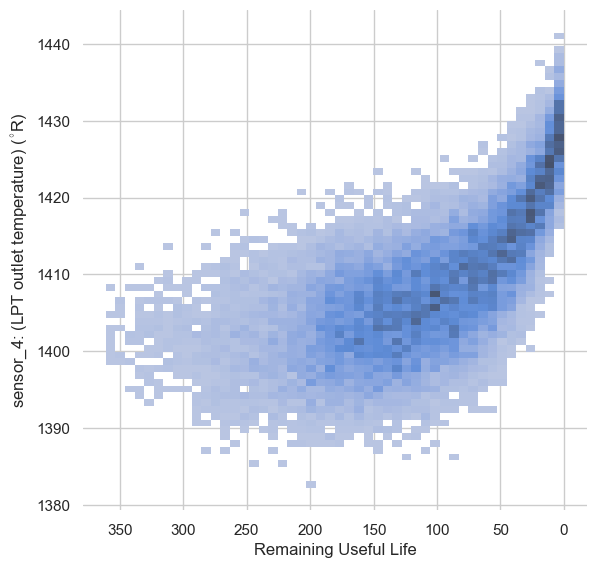

...

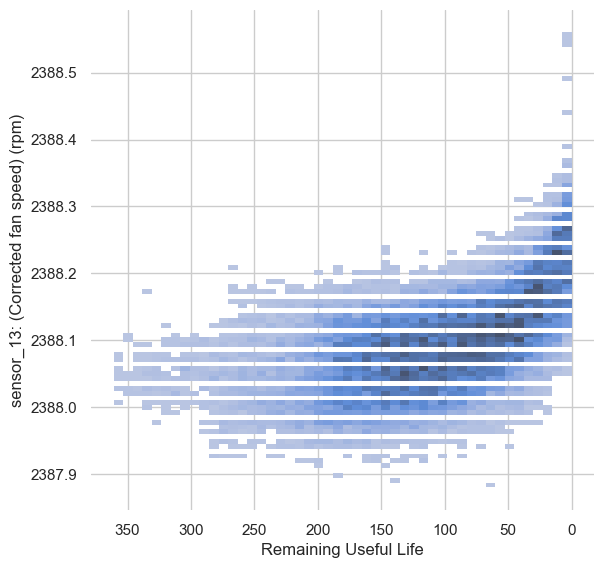

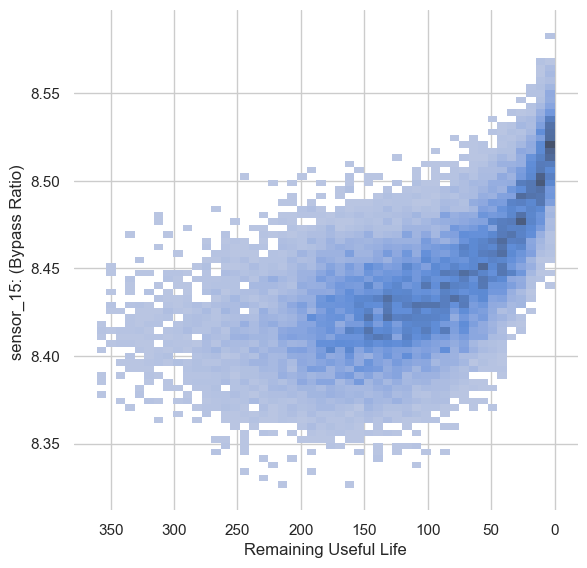

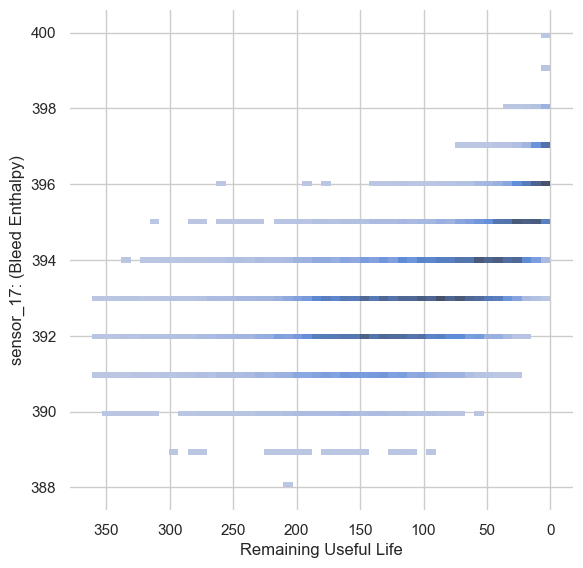

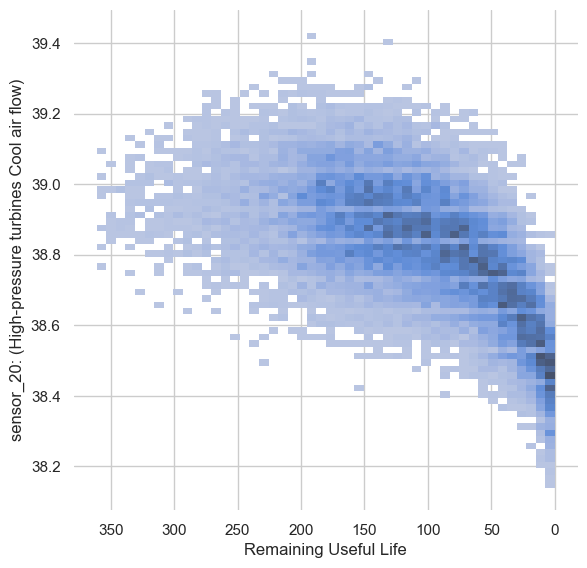

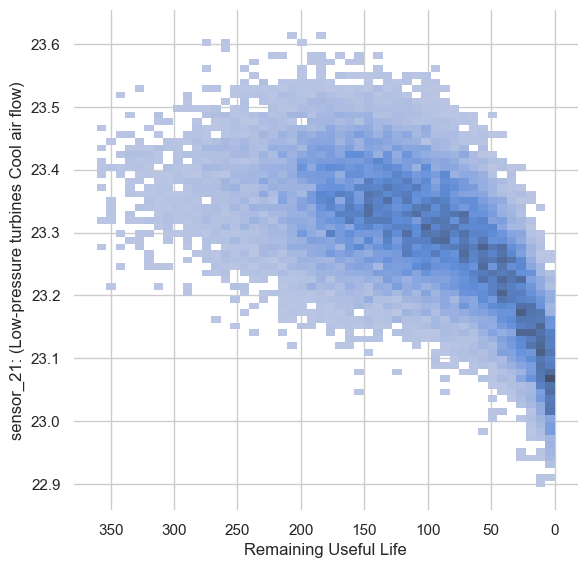

In [22]:
for sensor in features[2:-1]:
    try:
        plot_histogram(train_FD001, sensor_dictionary,sensor)
    except:
        pass

## Data Smoothing

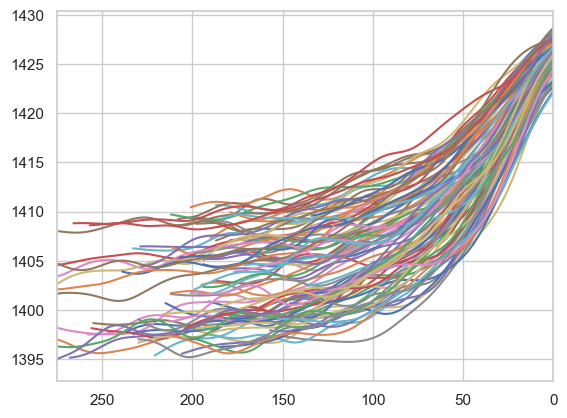

In [35]:
df = train_FD001

def GaussianKernel(x: float, sigma: float):
  x_n = x # / dx normalize x 
  kernel = np.exp(-(x**2)/(2*sigma**2))/np.sqrt(2*np.pi*sigma**2)
  return kernel

def Regression(x, x_sample, y_sample, alpha, k):
  y = np.zeros_like(x)
  # x_sample_norm = (x_sample - x_sample.mean()) / x_sample.std()
  x_norm = x # (x - x_sample.mean()) / x_sample.std()

  for idx, y_i in enumerate(y):
      kernel_sum = 0
      for x_sample_i, y_sample_i in zip(x_sample, y_sample):
        y_i += y_sample_i*GaussianKernel(x_norm[idx]-x_sample_i, alpha)
        kernel_sum += GaussianKernel(x_norm[idx]-x_sample_i, alpha)
      y[idx] = y_i / kernel_sum
  return y

for i in df[unit[0]].unique():
    if True or (i % 13 == 0):   #For a better visualisation, we plot the sensors signals of 20 units only
        x_sample = df[df[unit[0]]==i]['RUL'].to_numpy()
        y_sample = df[df[unit[0]]==i]['sensor_4'].to_numpy()
        x = np.linspace(x_sample.max(), x_sample.min(), num=np.size(x_sample))

        for sigma in [10]:
          y = Regression(x,x_sample,y_sample, sigma, i)

          label = "sigma = {}".format(sigma)
          plt.plot(x, y, label = label)
        # plt.legend()

        # plt.plot(x_sample,y_sample)
        plt.xlim([275,0])
plt.show()
        


In [ ]:
# Smooth all Data and Load into new DF

for sensor in features[4:-1]:
    for i in df[unit[0]].unique():
        if True or (i % 13 == 0):   #For a better visualisation, we plot the sensors signals of 20 units only
            x_sample = df[df[unit[0]]==i]['RUL'].to_numpy()
            y_sample = df[df[unit[0]]==i][sensor].to_numpy()
            x = np.linspace(x_sample.max(), x_sample.min(), num=np.size(x_sample))

            for sigma in [20]:
                y = Regression(x,x_sample,y_sample, sigma, i)
                df.loc[df[unit[0]]==i, sensor] = y        

operational_setting 1


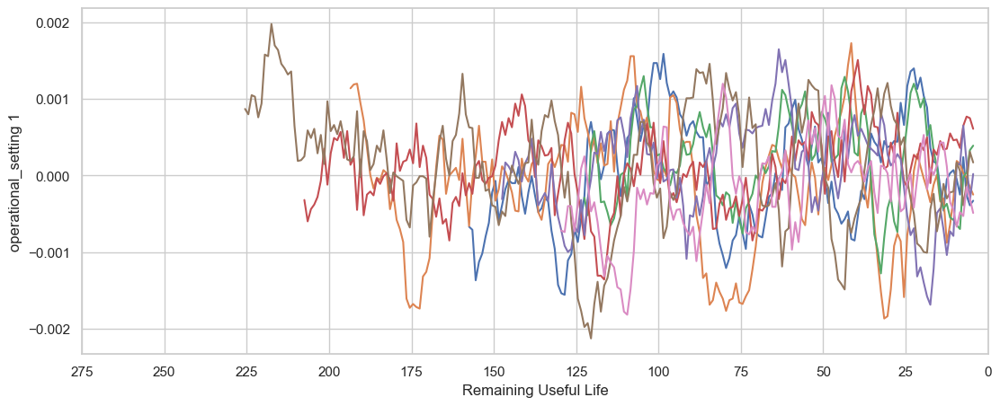

operational_setting 2


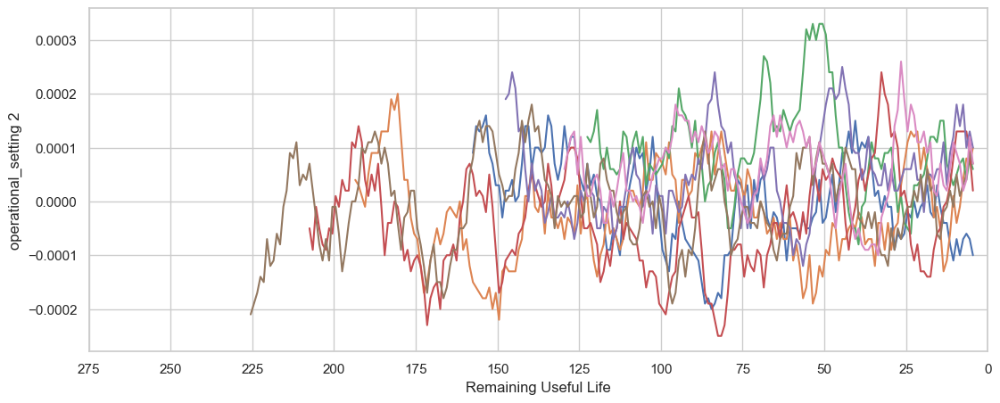

sensor_2


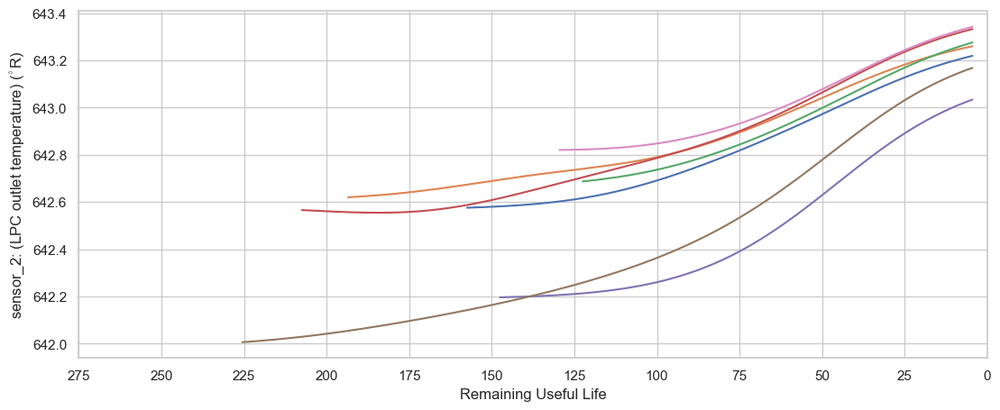

sensor_3


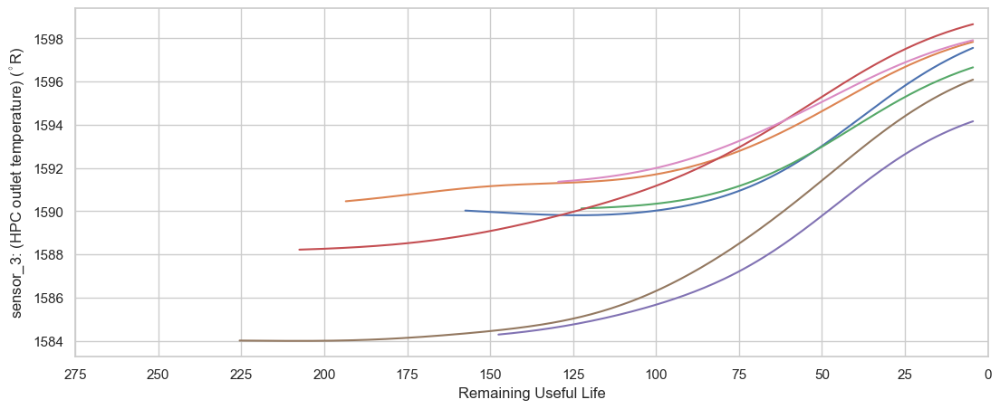

sensor_4


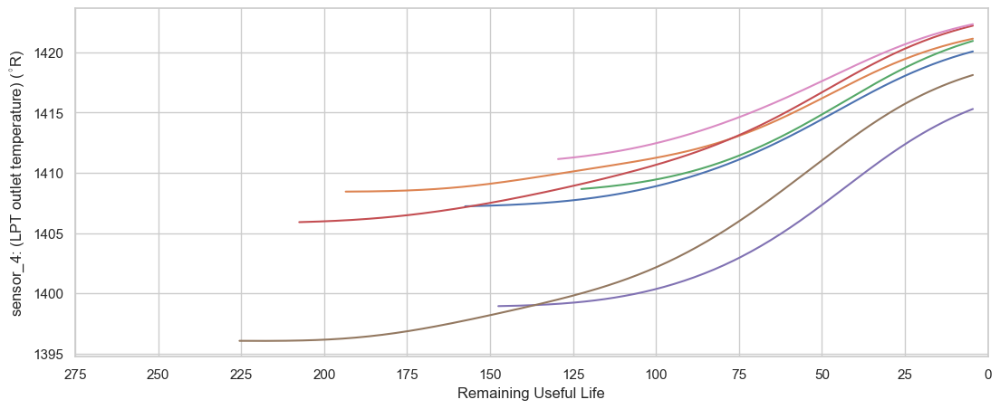

sensor_7


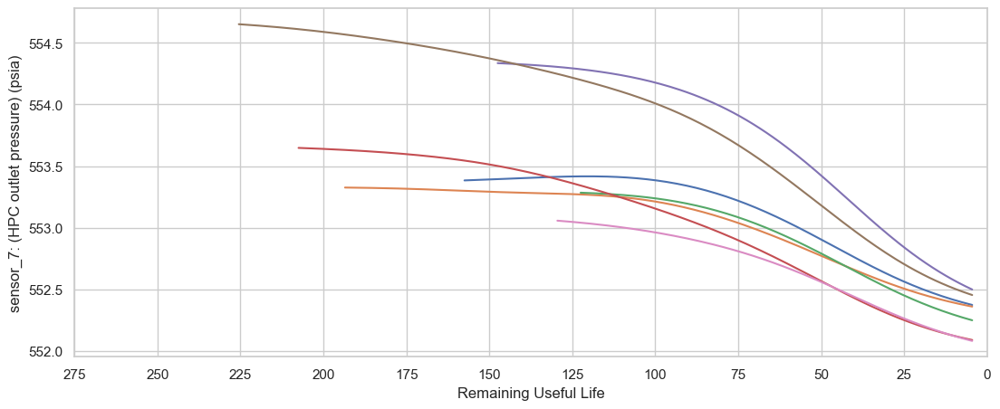

sensor_8


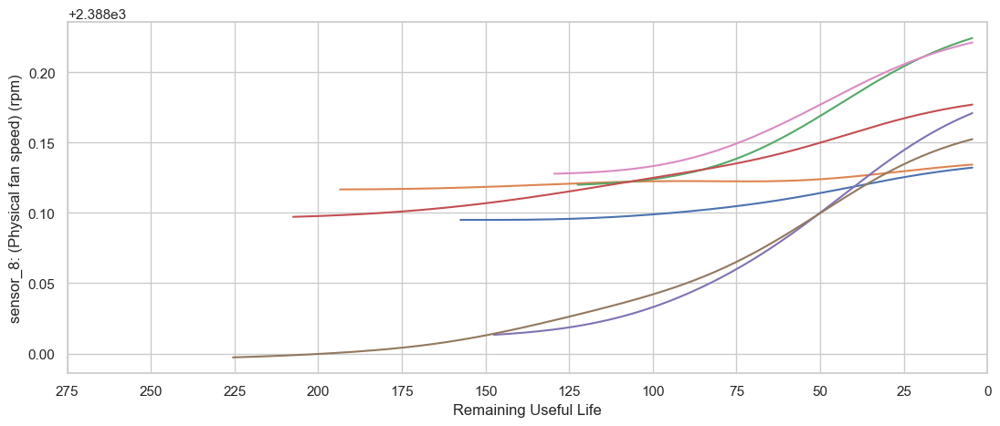

sensor_11


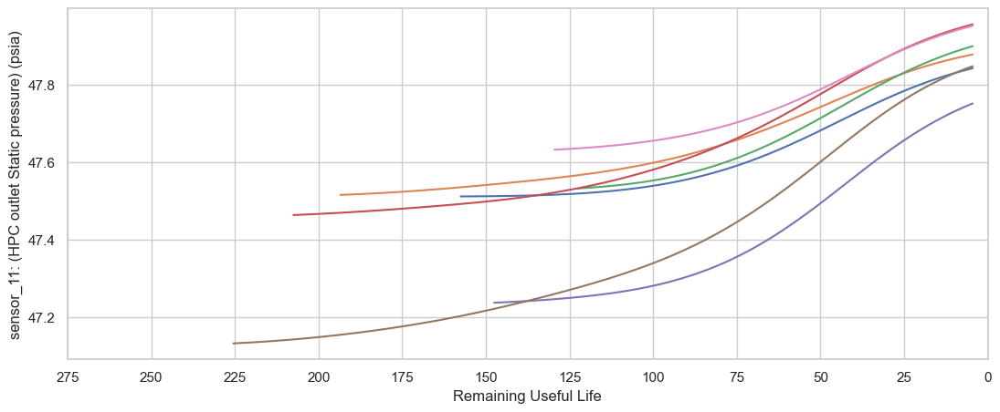

sensor_12


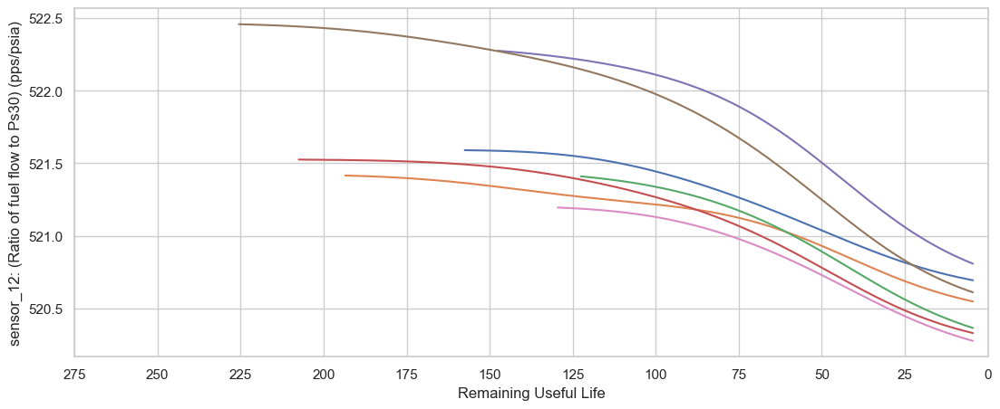

sensor_13


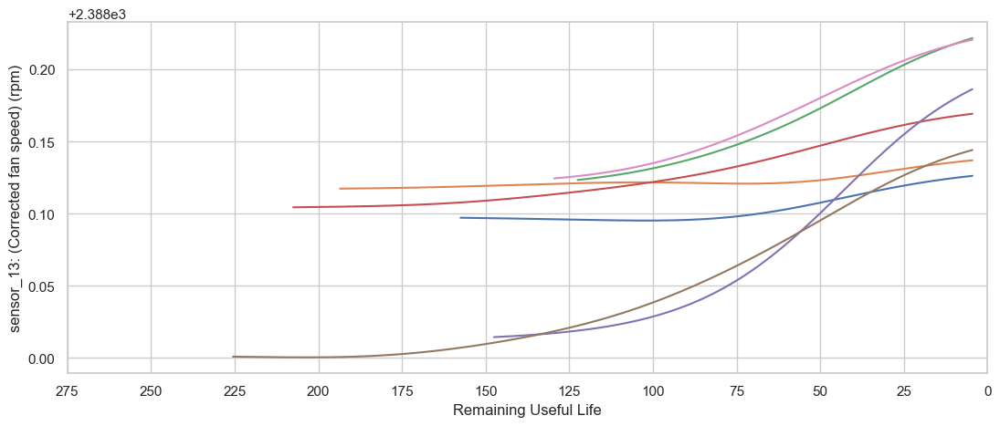

sensor_15


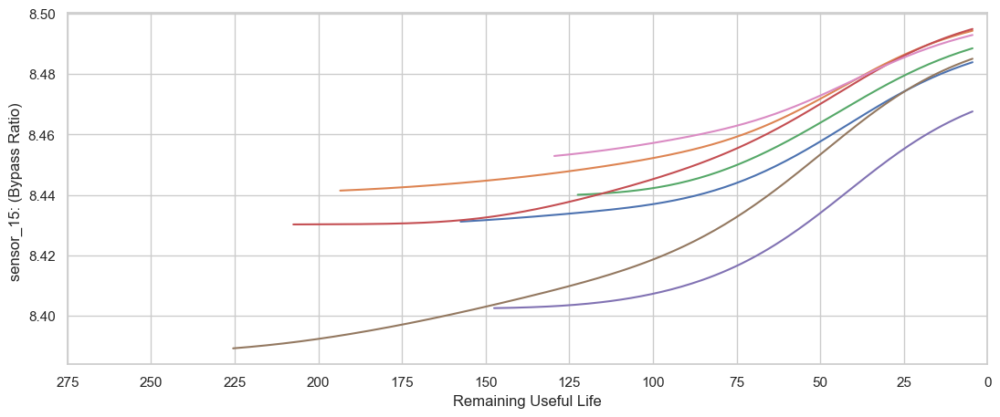

sensor_17


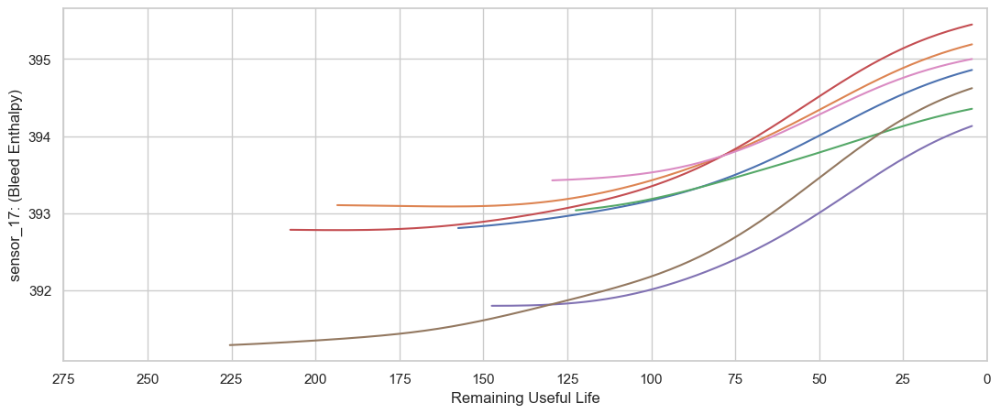

sensor_20


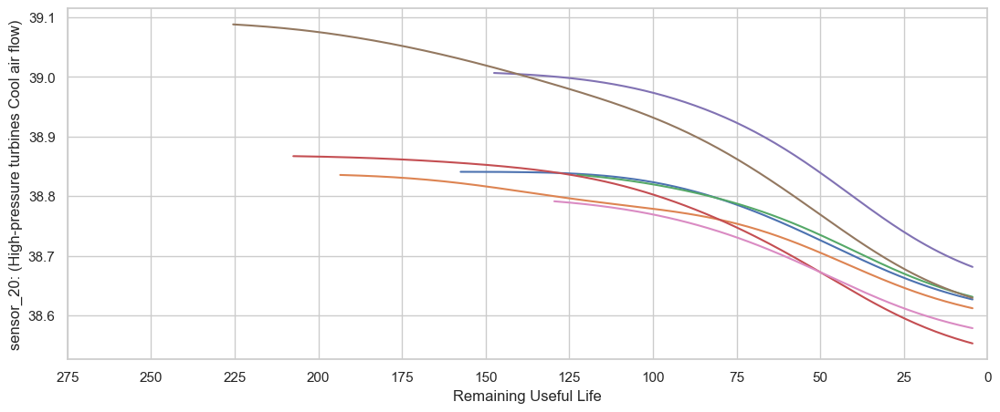

sensor_21


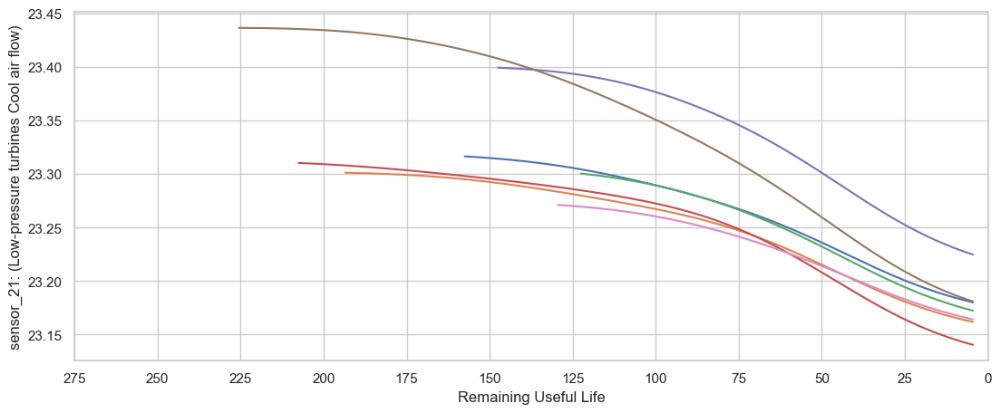

In [ ]:
for sensor in features[2:-1]:
    try:
        print(sensor)
        plot_signal(df, sensor_dictionary,sensor)
    except:
        pass

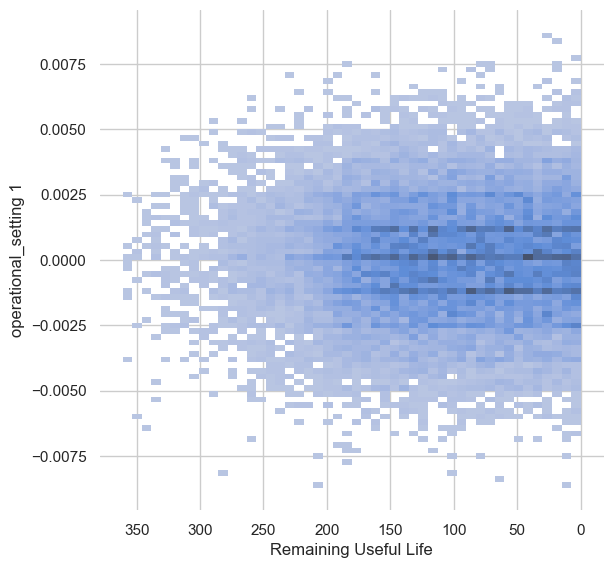

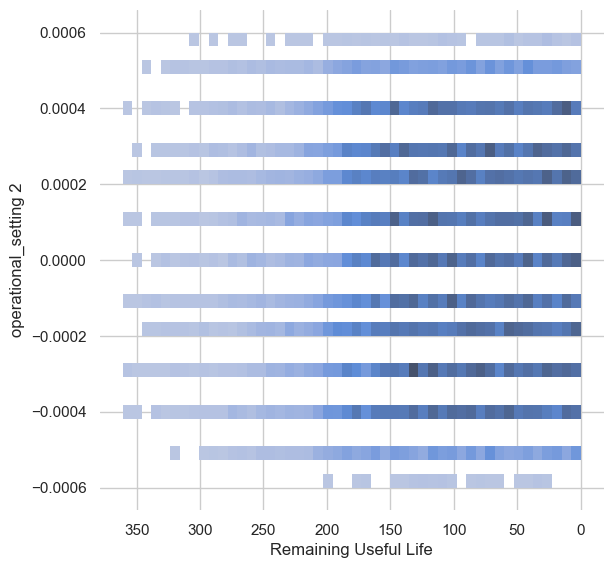

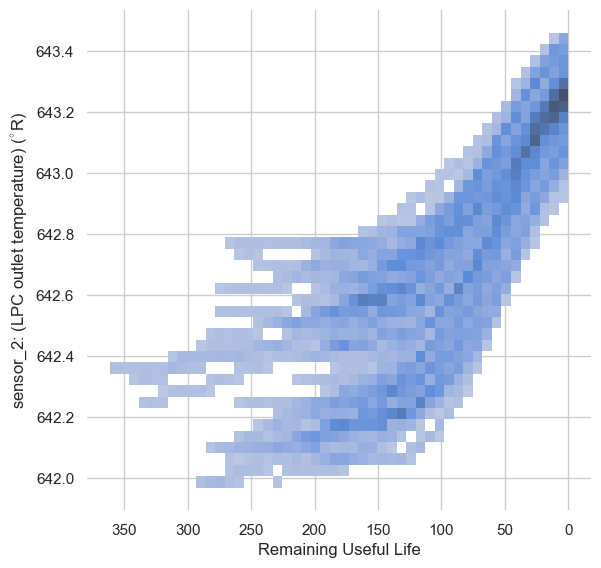

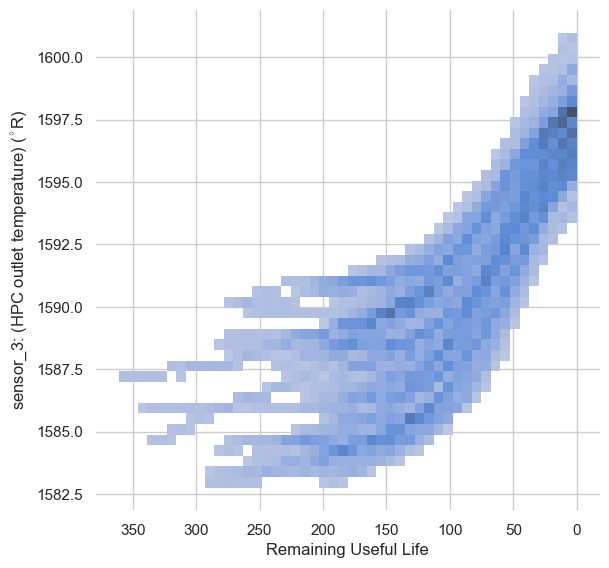

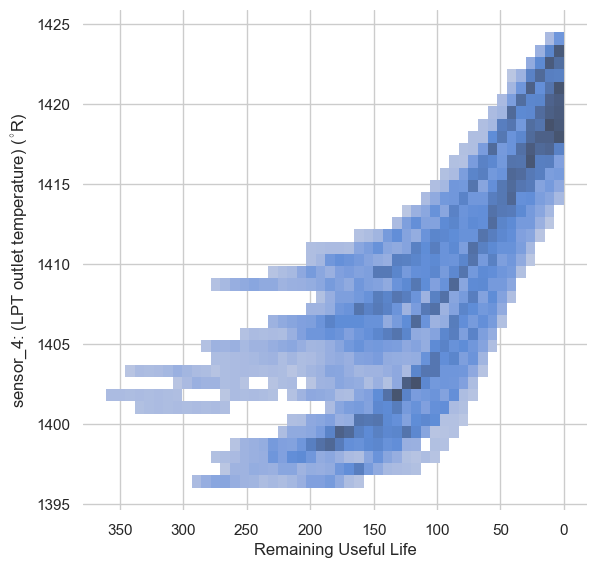

...

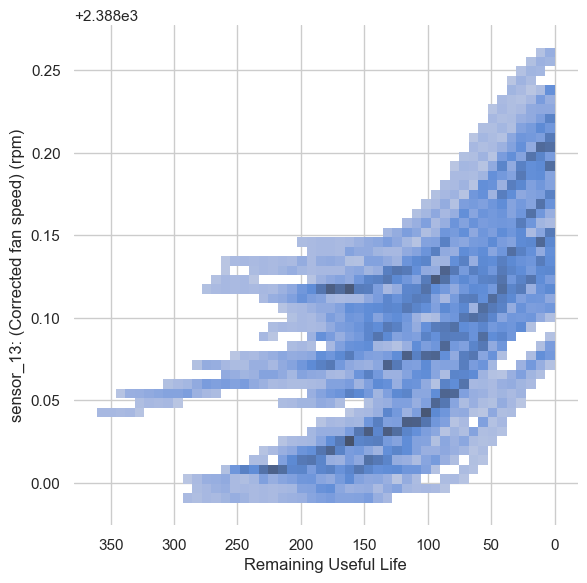

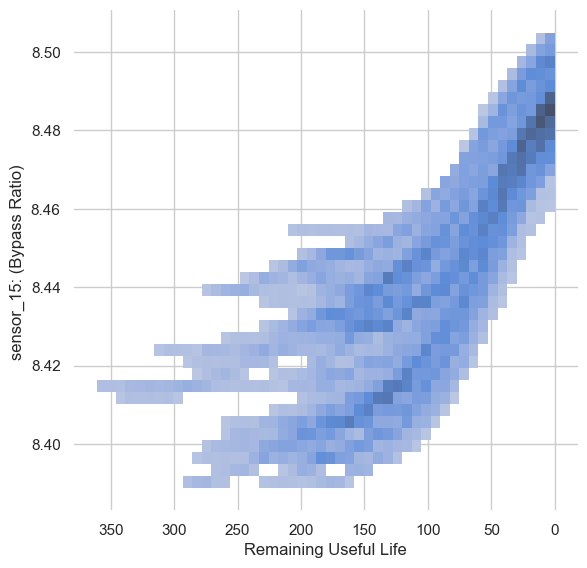

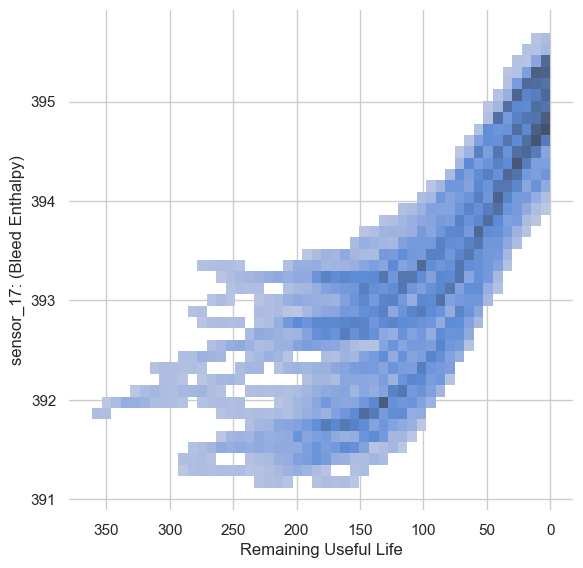

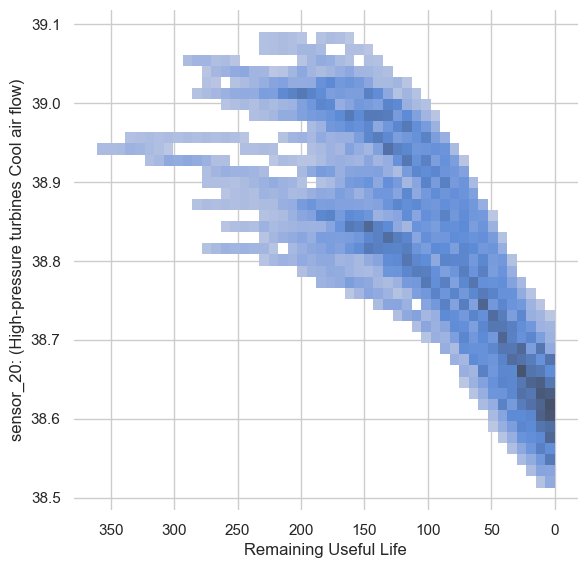

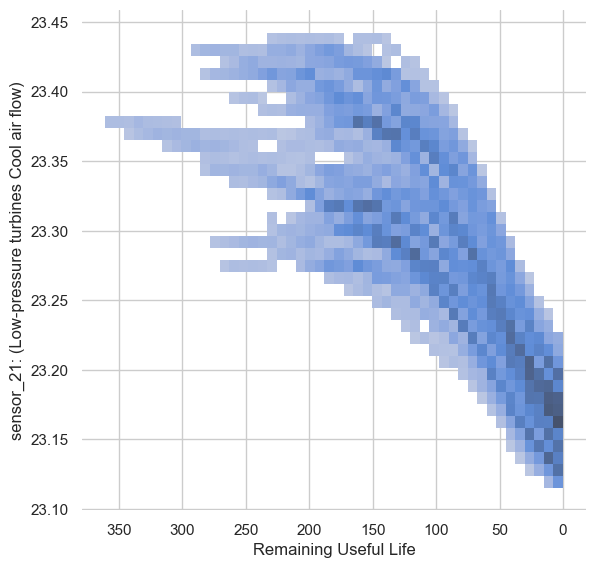

In [ ]:
for sensor in features[2:-1]:
    try:
        plot_histogram(df, sensor_dictionary,sensor)
    except:
        pass

In [ ]:
df.tail(203)

,unit_number,time,operational_setting 1,operational_setting 2,operational_setting 3,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,...,sensor_13,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21,RUL
20428,99,183,-0.0031,-0.0003,100.0,518.67,643.364446,1597.296181,1421.766970,14.62,...,2388.220554,8126.90,8.493979,0.03,395.128663,2388,100.0,38.607878,23.146866,2
20429,99,184,-0.0010,-0.0001,100.0,518.67,643.373875,1597.414158,1421.930050,14.62,...,2388.221973,8125.66,8.494624,0.03,395.146046,2388,100.0,38.604825,23.145135,1
20430,99,185,-0.0019,-0.0004,100.0,518.67,643.383119,1597.530250,1422.090094,14.62,...,2388.223358,8127.53,8.495256,0.03,395.162832,2388,100.0,38.601836,23.143450,0
20431,100,1,-0.0033,0.0003,100.0,518.67,642.417593,1588.300249,1402.899795,14.62,...,2388.068220,8146.76,8.421595,0.03,392.447570,2388,100.0,38.918067,23.339734,199
20432,100,2,0.0010,-0.0004,100.0,518.67,642.417004,1588.286333,1402.932192,14.62,...,2388.068155,8143.56,8.421747,0.03,392.448357,2388,100.0,38.917507,23.340271,198
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.335433,1598.748538,1423.448740,14.62,...,2388.209404,8137.60,8.501332,0.03,395.424647,2388,100.0,38.505295,23.123556,4
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.340832,1598.814327,1423.575845,14.62,...,2388.210452,8136.50,8.501897,0.03,395.442173,2388,100.0,38.502168,23.122142,3
20628,100,198,0.0004,0.0000,100.0,518.67,643.346085,1598.878791,1423.700420,14.62,...,2388.211472,8141.05,8.502447,0.03,395.459186,2388,100.0,38.499102,23.120756,2
20629,100,199,-0.0011,0.0003,100.0,518.67,643.351193,1598.941947,1423.822515,14.62,...,2388.212463,8139.29,8.502985,0.03,395.475693,2388,100.0,38.496095,23.119398,1


# Normalize the Data

https://developers.google.com/machine-learning/data-prep/transform/normalization

In [ ]:
train_FD001_normalized = pd.DataFrame()

for sensor in features[:2]:
    train_FD001_normalized[sensor] = df[sensor]

train_FD001_normalized['RUL'] = df['RUL']

for sensor in features[2:-1]:
    train_FD001_normalized[sensor] = df[sensor] # np.log(train_FD001[sensor])

for sensor in features[2:-1]:
    train_FD001_normalized[sensor] = (train_FD001_normalized[sensor] - train_FD001_normalized[sensor].mean()) / train_FD001_normalized[sensor].std()

train_FD001_normalized

,unit_number,time,RUL,operational_setting 1,operational_setting 2,sensor_2,sensor_3,sensor_4,sensor_7,sensor_8,sensor_11,sensor_12,sensor_13,sensor_15,sensor_17,sensor_20,sensor_21
0,1,1,191,-0.315972,-1.372920,-1.014797,-0.872080,-1.198705,1.095586,-0.629631,-1.158335,1.061598,-0.788562,-1.042661,-1.188361,1.097541,1.222504
1,1,2,190,0.872701,-1.031695,-1.014419,-0.873439,-1.198122,1.095126,-0.629684,-1.156934,1.061442,-0.787131,-1.041095,-1.187976,1.095419,1.221625
2,1,3,189,-1.961827,1.015652,-1.014035,-0.874849,-1.197498,1.094628,-0.629725,-1.155473,1.061263,-0.785644,-1.039471,-1.187587,1.093220,1.220686
3,1,4,188,0.324083,-0.008022,-1.013646,-0.876312,-1.196833,1.094089,-0.629754,-1.153950,1.061059,-0.784098,-1.037787,-1.187195,1.090941,1.219681
4,1,5,187,-0.864590,-0.690471,-1.013251,-0.877828,-1.196122,1.093505,-0.629769,-1.152362,1.060827,-0.782491,-1.036041,-1.186799,1.088579,1.218608
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,4,-0.178817,-1.031695,1.673452,1.836379,1.819650,-1.984437,1.611590,1.903085,-1.788555,1.673763,1.863450,1.854461,-2.058565,-1.870583
20627,100,197,3,-0.727436,-1.714145,1.682471,1.845617,1.830223,-1.996855,1.621967,1.913386,-1.799676,1.684061,1.874978,1.864660,-2.071189,-1.881050
20628,100,198,2,0.186928,-0.008022,1.691202,1.854551,1.840444,-2.008888,1.632006,1.923346,-1.810447,1.694036,1.886144,1.874526,-2.083423,-1.891170
20629,100,199,1,-0.498845,1.015652,1.699652,1.863189,1.850324,-2.020547,1.641716,1.932974,-1.820877,1.703694,1.896956,1.884067,-2.095276,-1.900952


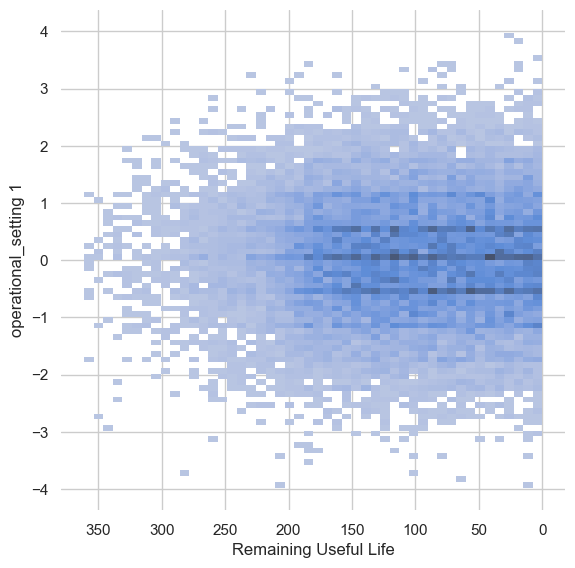

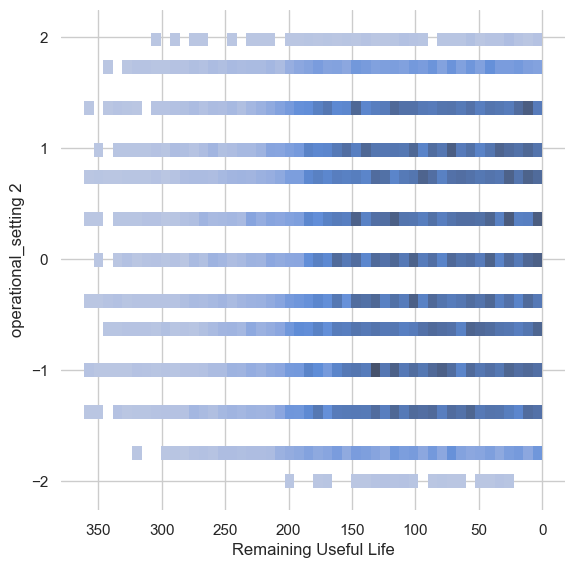

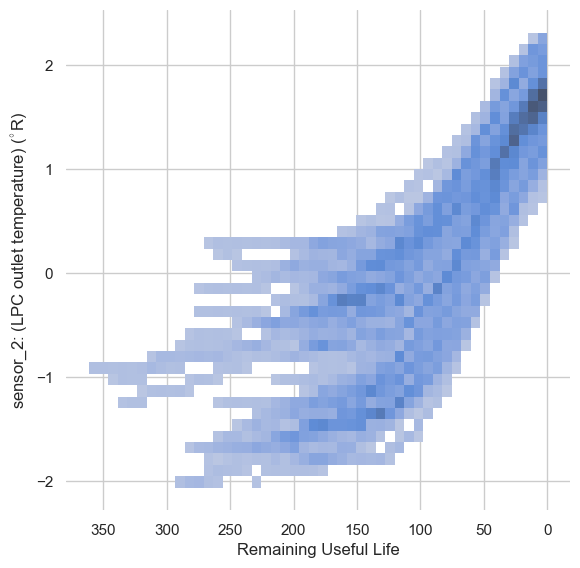

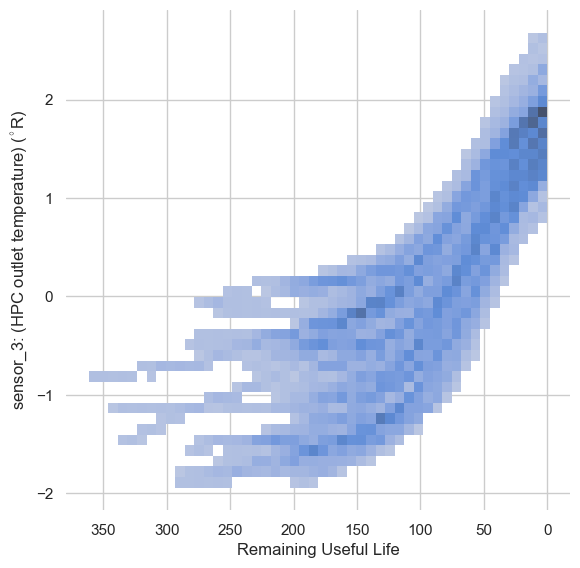

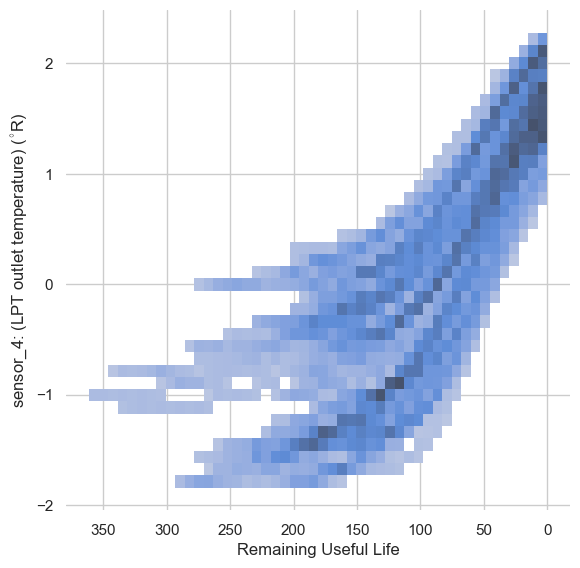

...

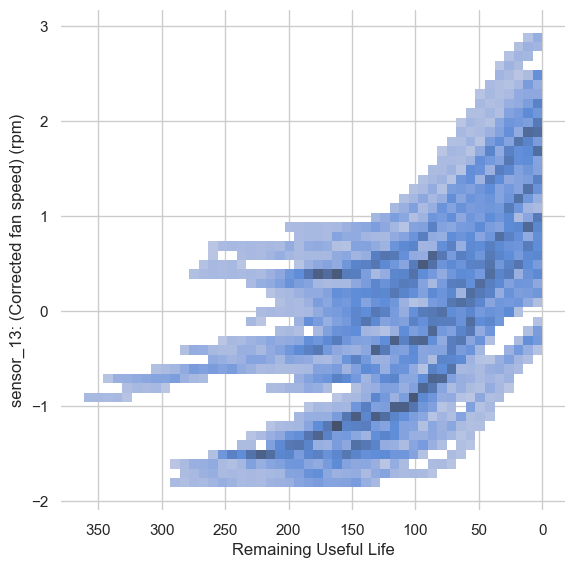

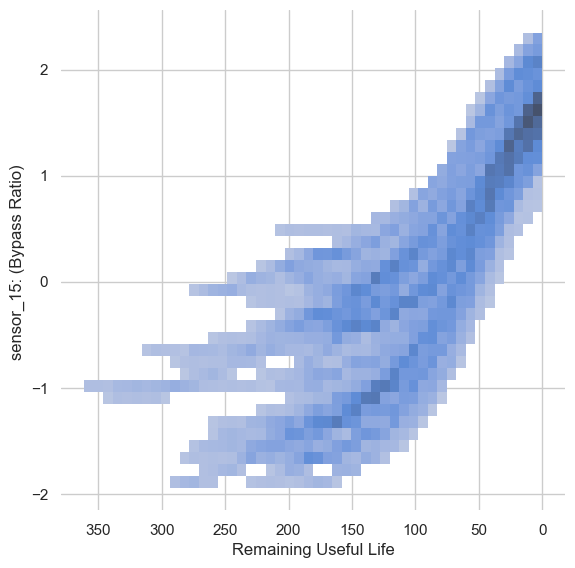

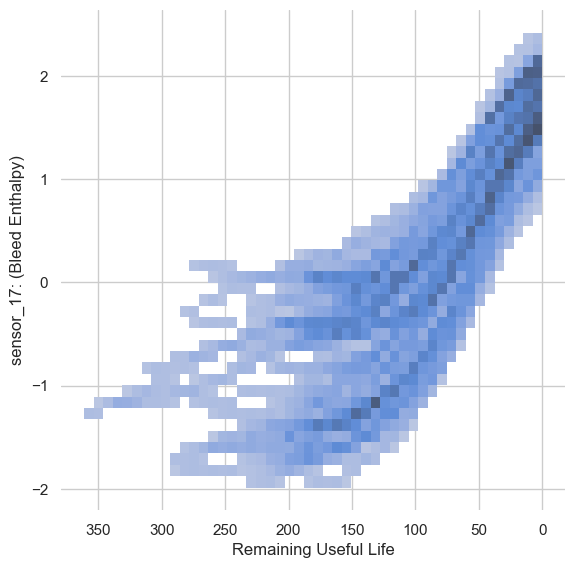

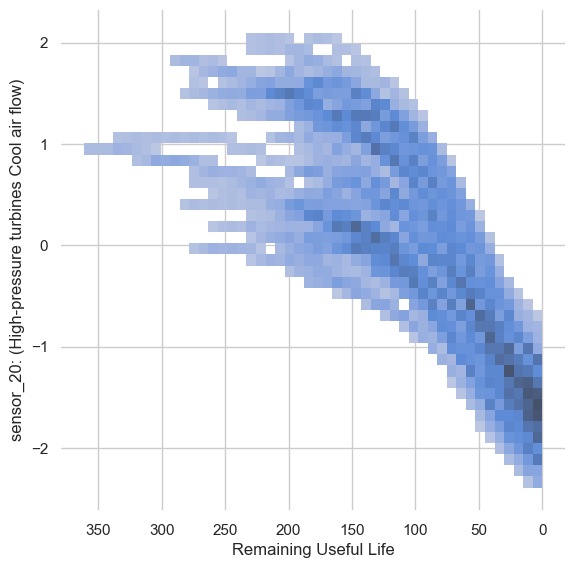

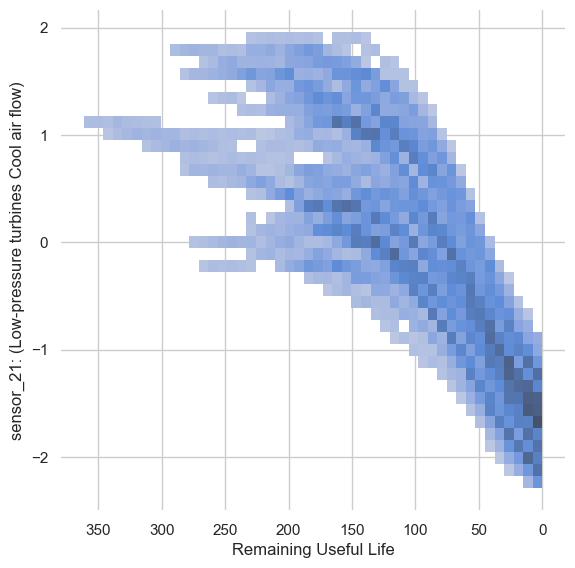

In [ ]:
for sensor in features[2:-1]:
    try:
        plot_histogram(train_FD001_normalized, sensor_dictionary,sensor)
    except:
        pass

In [ ]:
# store to CSV

train_FD001_normalized.to_csv('features/train_fd_001_normalized.csv')

In [ ]:
print(features[4:-1])

Index(['sensor_2', 'sensor_3', 'sensor_4', 'sensor_7', 'sensor_8', 'sensor_11',
       'sensor_12', 'sensor_13', 'sensor_15', 'sensor_17', 'sensor_20',
       'sensor_21'],
      dtype='object')
